___
# Introduction To OCR:

- **Optical Character Recognition, or OCR**, is a common task in many domains. The earliest **OCR** systems were designed to serve the vision impaired. Its modern application, however, has extended to a far wider population. The goal of **OCR** is to take an input image and output raw text while maintaining the structure of the text in the image. In othere words, its end-goal is to preserve the line breaks, paragraph segmentation, and other features of the structure of the text on the page.
 **WORKFLOW:**
- **PIL(PILLOW)** - Open an Image
- **OpenCV** - Change an Image, It is one of the most popular computer vision libraries.
- **Tesseract(Pytesseract)** - OCR on Image, It is a wrapper of Google Tesseract engine.

# Installation:
##### **PILLOW** - pip install pillow
##### **OpenCV** - pip install opencv-python
##### **Pytesseract** - pip install pytesseract
To work with Tesseract, You have to install tesseract from UB Mainheim: https://github.com/UB-Mannheim/tesseract/wiki

### How to open an Image in Python with pillow

In [1]:
from PIL import Image
im_file = "data/page_01.jpg"
im = Image.open(im_file)

In [2]:
# im file contain meta information about the open image file
print(im)

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1200x1522 at 0x1E0F997FBD0>


In [3]:
# Size of the image
print(im.size)

(1200, 1522)


In [4]:
# Image mode of the image
print(im.mode)

RGB


In [5]:
# The function show() is used to open the image file in windows photos app
im.show()

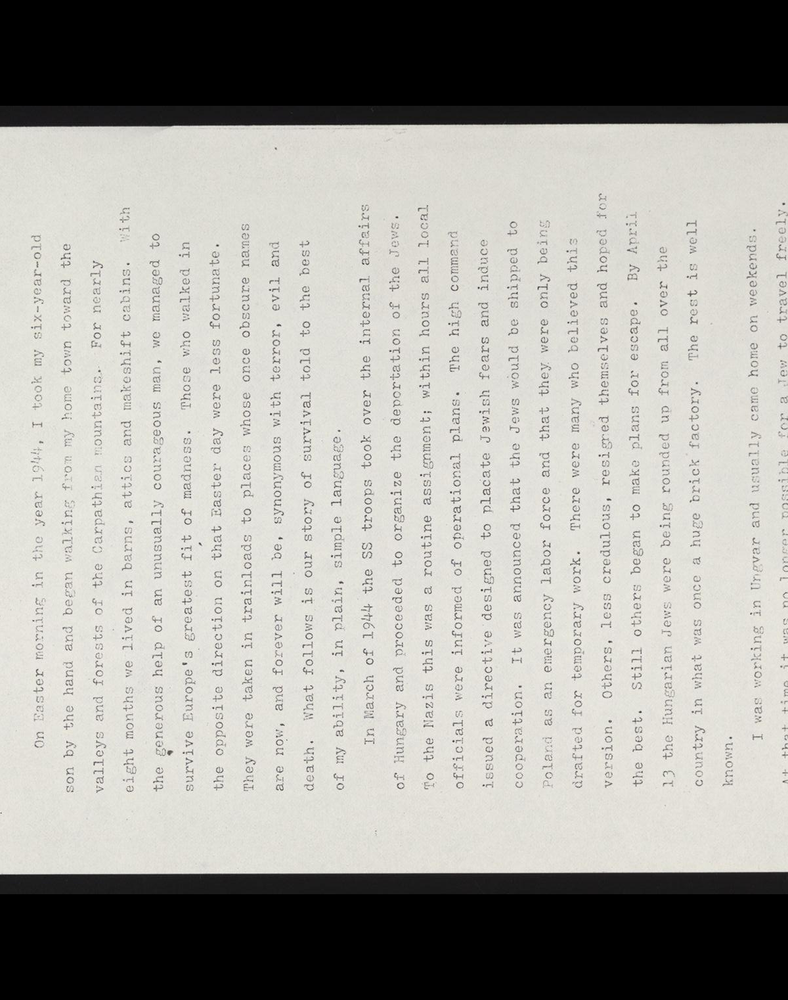

In [6]:
# the function ratate is used to ratate the image at an angle
im.rotate(90)

In [7]:
#It saves the image at the given location with given name
im.save("temp/page_01.jpg")

## How to preprocessing Images fo Text OCR in Python

Here we use OpenCV
- **OpenCV** stand for Computer Vision.
- Computer Vision is a complex task that requires you to manipulate images or video feeds in complex ways.


In [3]:
import cv2
from matplotlib import pyplot as plt

#Opening an Image file using CV2
img = cv2.imread("data/page_01.jpg")

In [9]:
cv2.imshow("Original",img)
cv2.waitKey(0)

-1

In [10]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)
    height, width, depth = im_data.shape

    #What size does the figure need to be in inches to fit the image
    figsize = width / float(dpi) , height / float(dpi)

    #Create a figure of right size with one axes that takes up the full figure
    fig = plt.figure(figsize = figsize)
    ax = fig.add_axes([0,0,1,1])

    #Hide spines, ticks etc.
    ax.axis('off')

    #Display the Image
    ax.imshow(im_data, cmap = 'gray')
    plt.show()

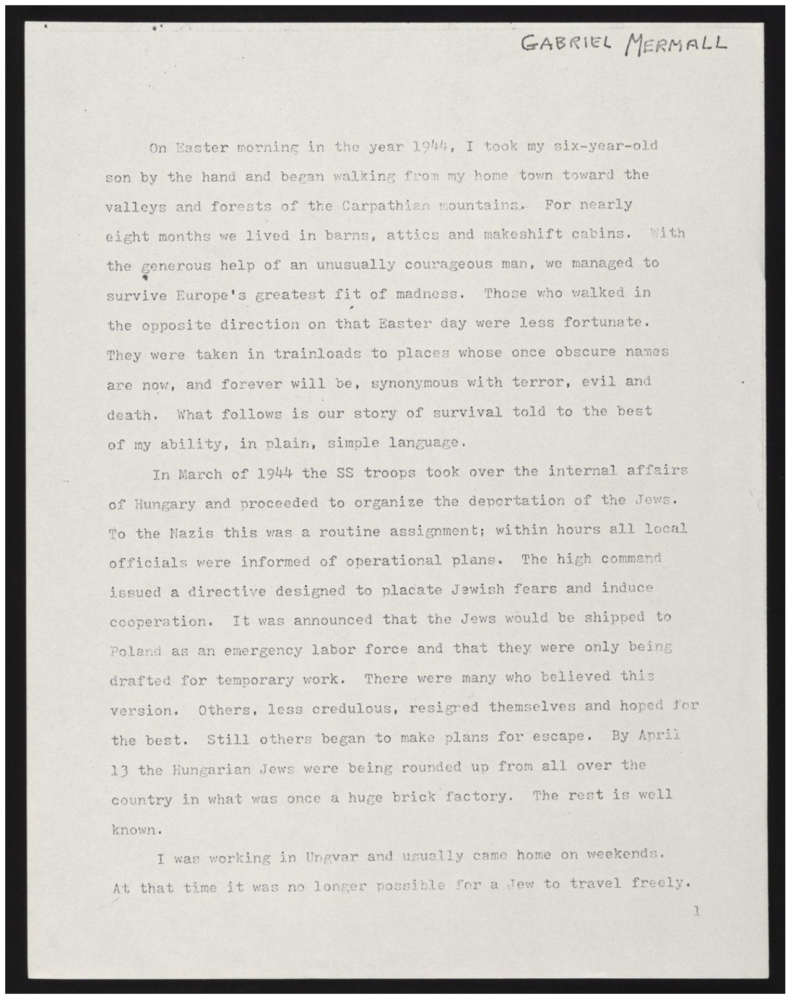

In [11]:
display(im_file)

## 1. Inverted Image

In [12]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite("temp/inverted_image.jpg",inverted_image)

True

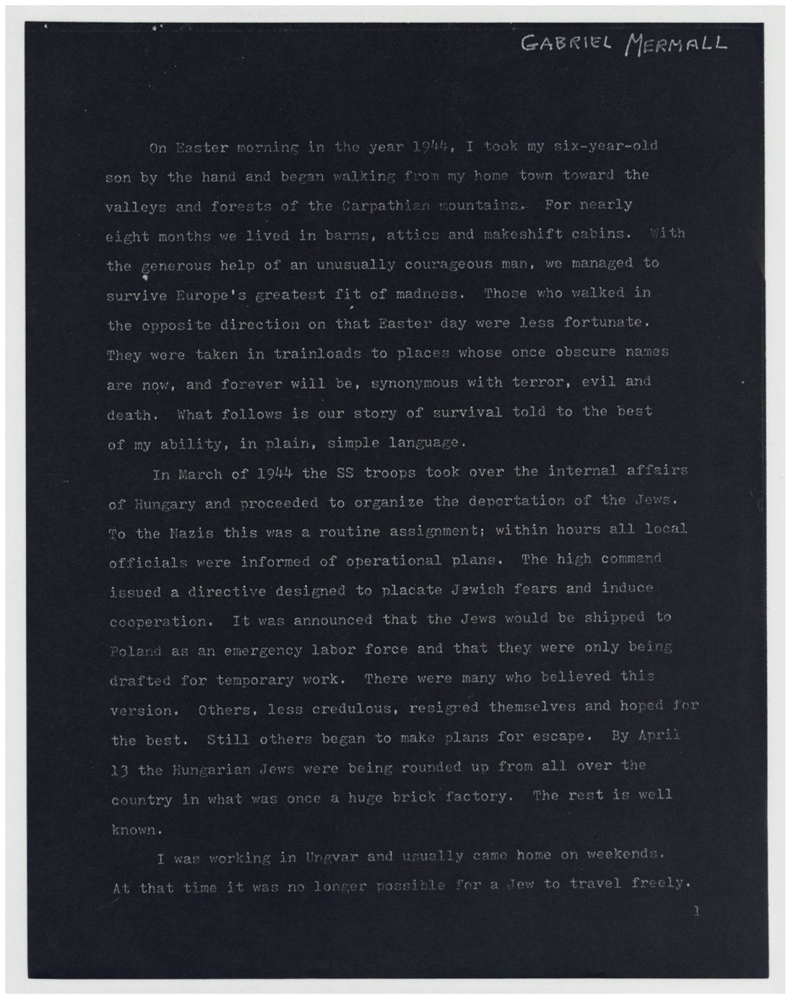

In [13]:
display("temp/inverted_image.jpg")

## 2) Binarization

In [14]:
def grayscale(image):
    return cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

gray_img = grayscale(img)
cv2.imwrite("temp/gray_image.jpg",gray_img)

True

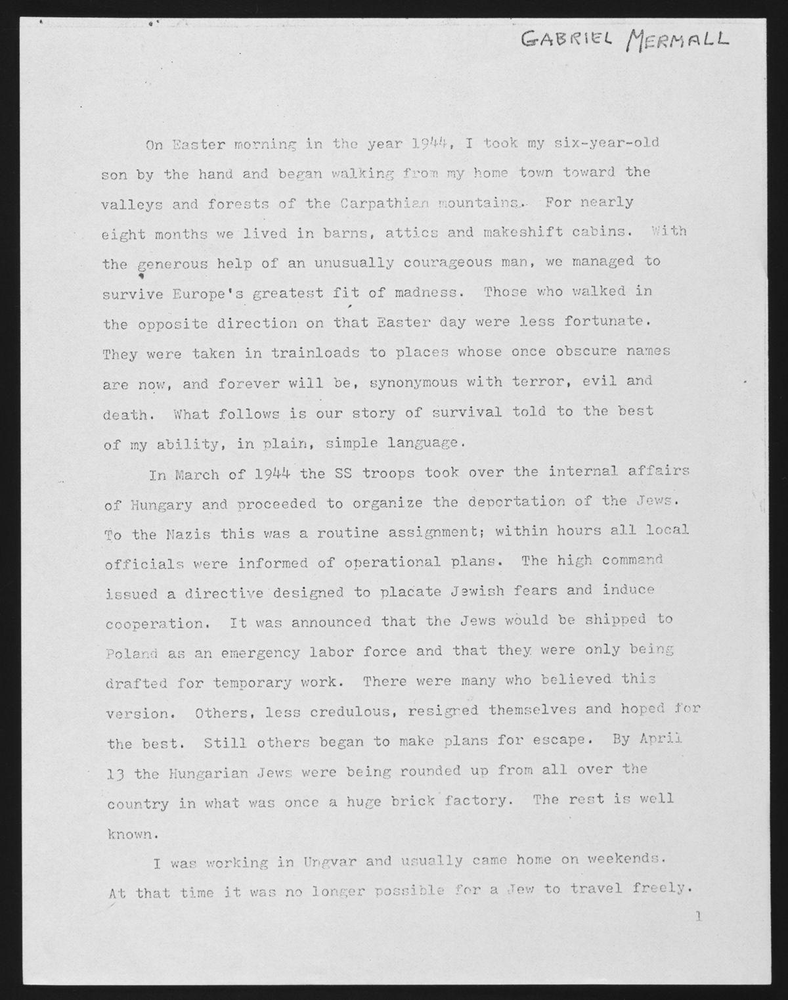

In [15]:
gray_im = Image.open("temp/gray_image.jpg")
gray_im

In [16]:
thresh, im_bw =cv2.threshold(gray_img,210,230,cv2.THRESH_BINARY)
cv2.imwrite("temp/blackwhite_img.jpg",im_bw)

True

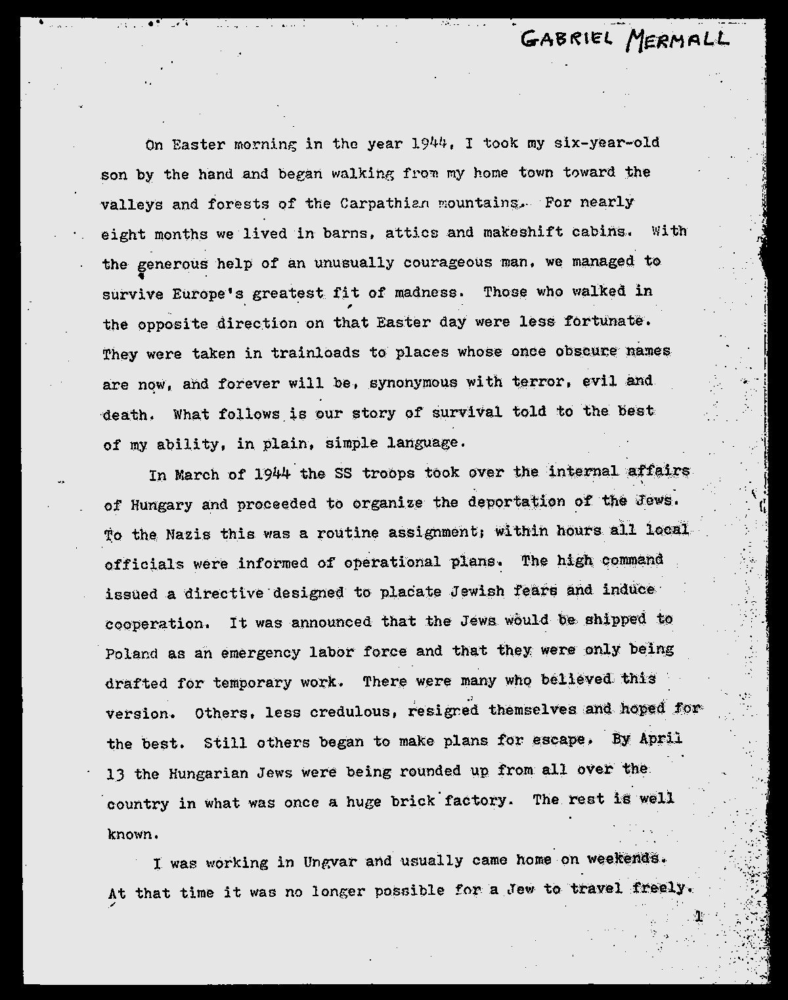

In [17]:
binary_img = Image.open("temp/blackwhite_img.jpg")
binary_img

## 3) Noise Removal

In [18]:
import numpy as np
def noise_removal(image):
    kernel = np.ones((1,1),np.uint8)
    image = cv2.dilate(image,kernel,iterations = 1)
    kernel = np.ones((1,1),np.uint8)
    image = cv2.erode(image, kernel, iterations = 1)
    image =cv2.morphologyEx(image,cv2.MORPH_CLOSE,kernel)
    image =cv2.medianBlur(image,3)
    return image

In [19]:
no_noise = noise_removal(im_bw)
cv2.imwrite("temp/no_noise_image.jpg",no_noise)

True

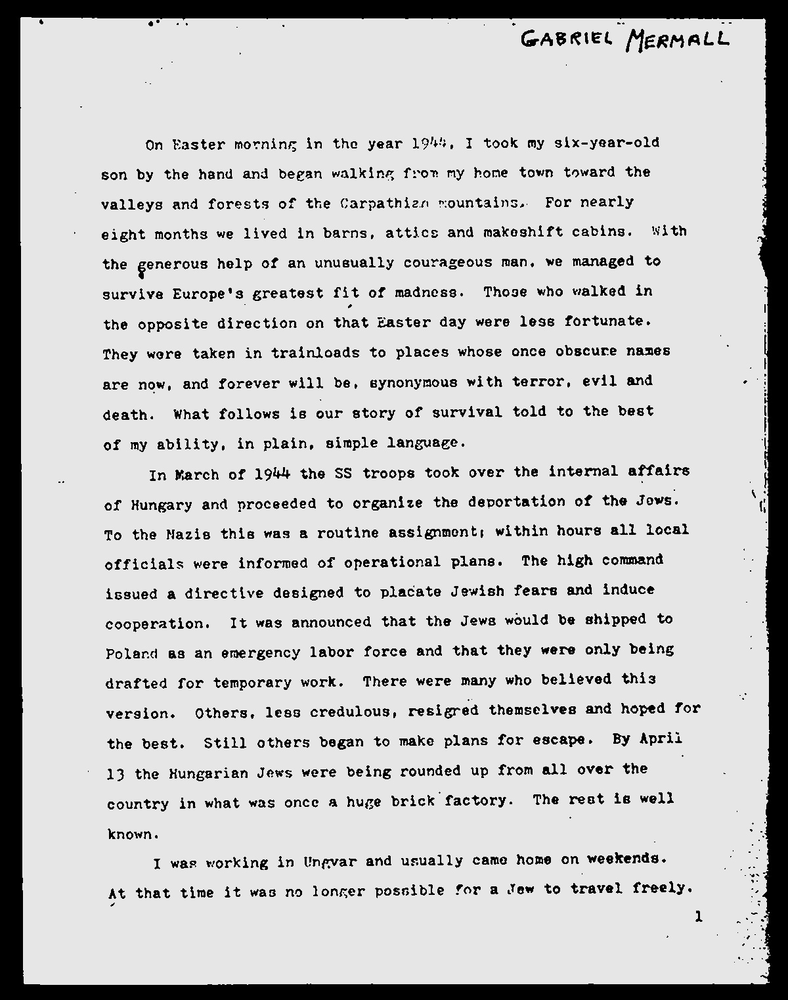

In [20]:
no_noise_img = Image.open("temp/no_noise_image.jpg")
no_noise_img

## 4) Dilation and Erosion

In [21]:
def thin_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.erode(image,kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return image

In [22]:
eroded_image =thin_font(no_noise)
cv2.imwrite("temp/eroded_image.jpg",eroded_image)

True

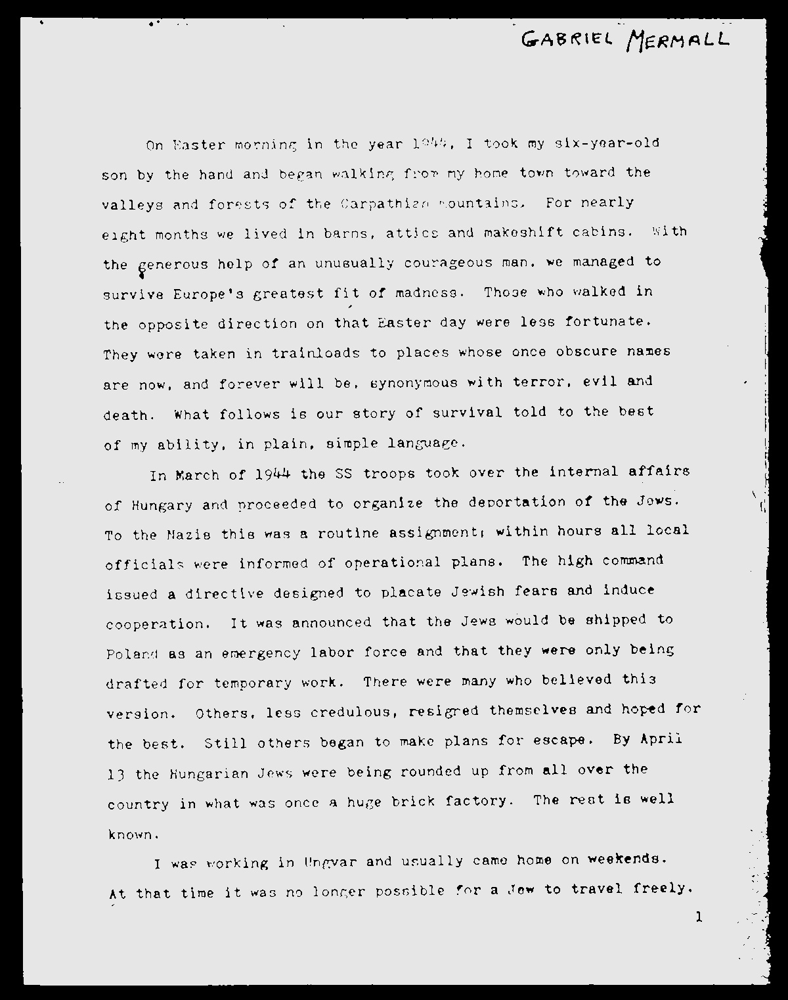

In [23]:
eroded_img = Image.open("temp/eroded_image.jpg")
eroded_img

In [24]:
def thick_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image,kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return image

In [25]:
dilated_image =thick_font(no_noise)
cv2.imwrite("temp/dilated_image.jpg",dilated_image)

True

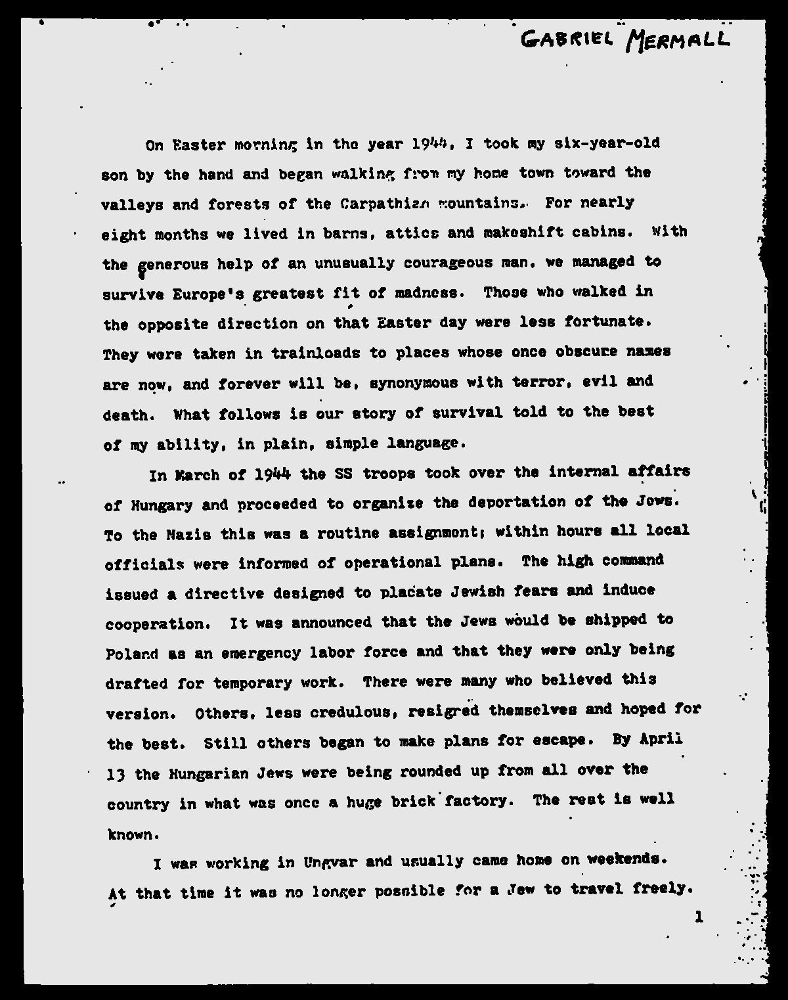

In [26]:
dilated_img = Image.open("temp/dilated_image.jpg")
dilated_img

## 5) Rotation and Deskewing

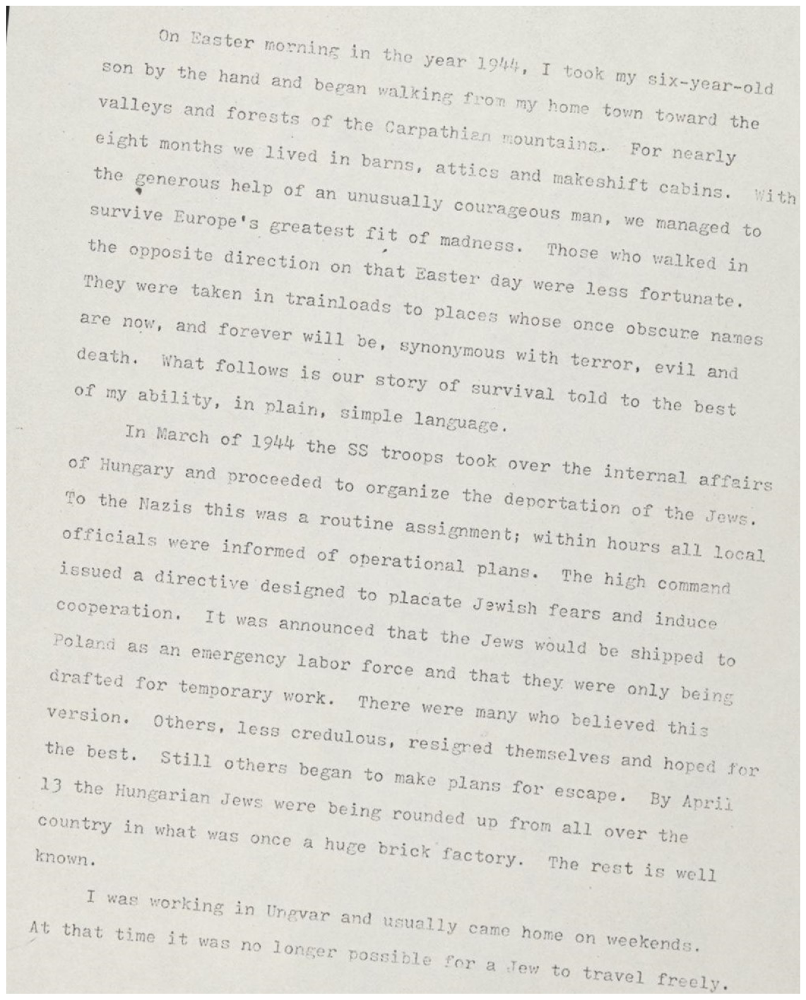

In [27]:
new = cv2.imread("data/page_01_rotated.JPG")
display("data/page_01_rotated.JPG")

In [28]:
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [29]:

# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [30]:
fixed = deskew(new)
cv2.imwrite("temp/rotated_fixed.jpg", fixed)

28


True

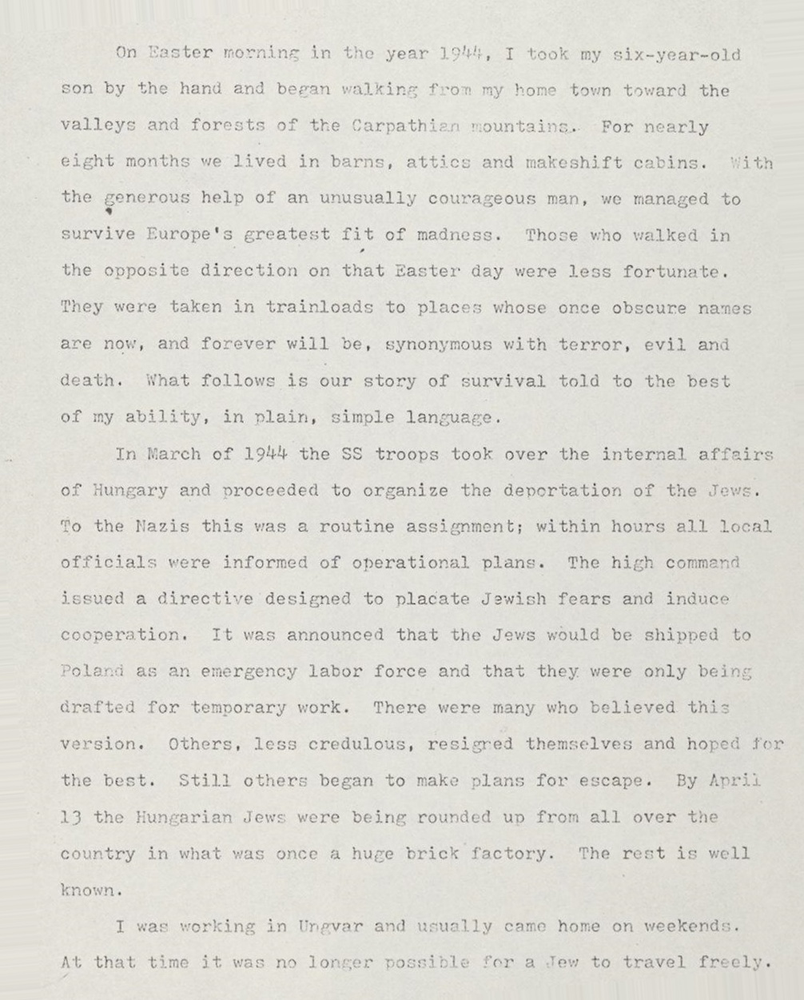

In [31]:
Reskew_img = Image.open("temp/rotated_fixed.jpg")
Reskew_img

## 6) Removing Borders

In [32]:
def remove_borders(image):
    contours, hierarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntSorted = sorted(contours, key = lambda x: cv2.contourArea(x))
    
    cnt = cntSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop_image = image[y: y+h, x: x+w]
    return crop_image

In [33]:
no_borders = remove_borders(no_noise)
cv2.imwrite("temp/no_borders.jpg",no_borders)

True

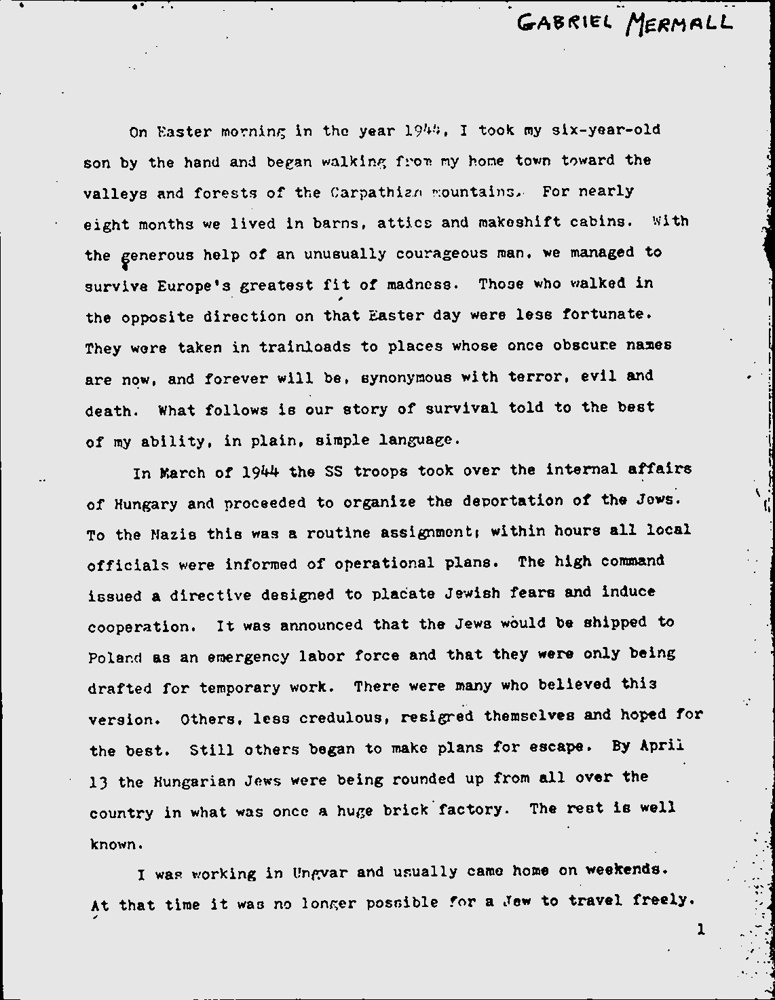

In [34]:
No_border_img = Image.open("temp/no_borders.jpg")
No_border_img

## 7) Add Missing Borders

In [35]:
color = [255,255,255]
top, bottom, left, right = [150]*4
image_with_border = cv2.copyMakeBorder(no_borders,top,bottom,left,right, cv2.BORDER_CONSTANT, value = color)

In [36]:
cv2.imwrite("temp/added_border.jpg",image_with_border)

True

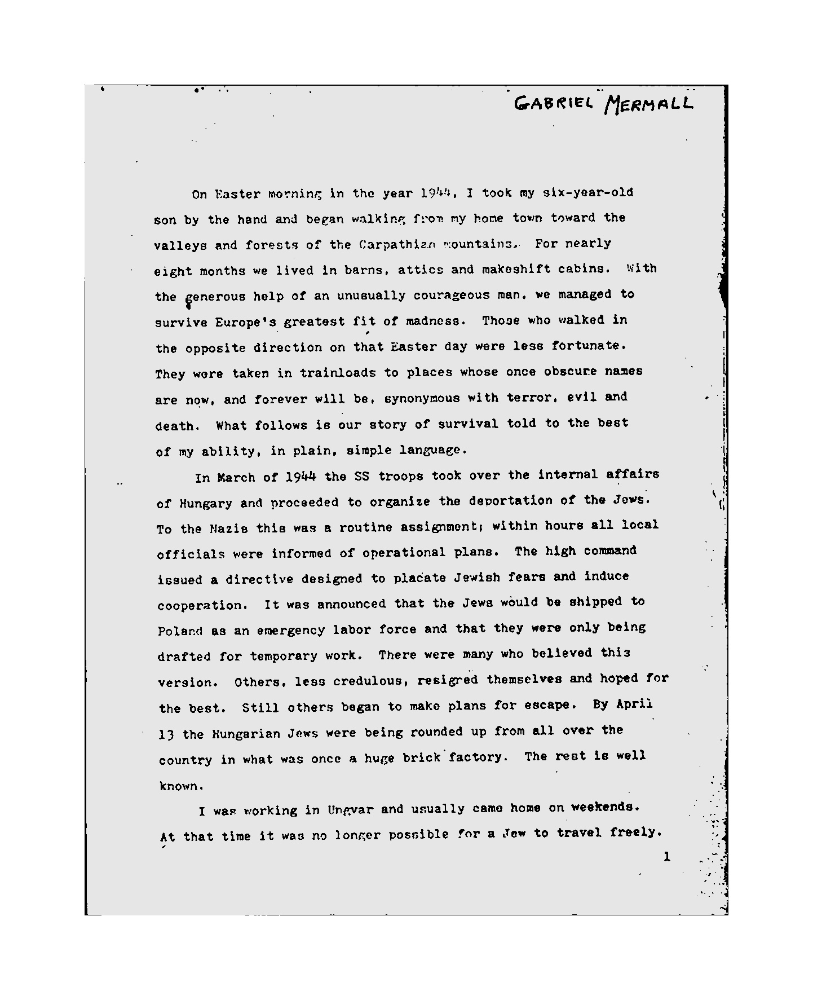

In [37]:
border_img = Image.open("temp/added_border.jpg")
border_img

# Introduction to Pytesseract

In [4]:
import pytesseract
from PIL import Image
import cv2

In [5]:
img_file = "data/page_01.jpg"
no_noise = "temp/no_noise_image.jpg"

In [6]:
img = Image.open(no_noise)
ocr_result = pytesseract.image_to_string(img)
print(ocr_result)

“GABRIEL Meamall

On Easter morning in the year 1944, I took my six-year-old
son by the hand and began walking fron my home town toward the
valleys and forests of the Carpathi2n mountains. For nearly
eight months we lived in barns, attics and makeshift eabins. With
the pene nous nelp of an unusually courageous man, we managed to
survive Europe's greatest fit of madness. Those who walked in
the opposite direction on that Easter day were lese fortunate.
They were taken in trainloads to places whose once obscure names
are now, and forever will be, synonymous with terror, evil and
death. What follows is our story of survival told to the best
of my ability, in plain, simple language.

In March of 1944 the SS troops took over the internal affairs
of Hungary and proceeded to organize the deportation of the dows.
To the Nazie thie was a routine assignment; within hours all local
officials were informed of operational plans. The high command
issued a directive designed to placate Jewish fears a

## How to do OCR an Index in Python with Pytesseract

In [7]:
image_file = "data/Index_02.jpg"
img = Image.open(image_file)
ocr_result = pytesseract.image_to_string(img)
print(ocr_result)

INDEX NOMINUM.

SCRIPSIT KAROLUS HAMPE.

Maior numerus indicat paginam, minor lineam.

A.v. E.

Aaron 38, 20. 123, 18. 168, 6. 203, 38. |

Abacue propheta 36, 5. 319,29. 373, 23.
Abagarus rex Edessenorum 382, 13.
Abdenago 585, 3.

Abel 26, 11.

Abigail 606, 6.

Abraham 26,18. 124,18. 133, 23, 2:
264. 302, 13. 303, 13. 320, 40. 328, 1.
496, 22.

Absalon 102, 5.

Acgfredi v. Ecgfridus.

Achab rex 504, 1.

Achaz rex 504,1.

Achiel 606, 19.

Achilon 496, 26.

Adal-, Adel-, Adhel-, Aedel-, Aedel-,
‘Aedil-, Aed
Athel-, Athil-, Aethel-, Aethil-
Ethel-.

Aedelbaldusabb.S. Petri Wiremuthen-
sis et S. Pauli Girwensis 110, 28.

Aedilberctus, Aedilberthus ep. Ha-
gulstadensis, antea ep. Candidae
casae sive Witernensis 27,43. 72,16.

Adalbertus, Aedilberctus sive Magus,
discipulus et capellanus Arnonis
archiep. Salisburg., postea_abb.
Ferrariensis 254, 1. 320, 41. 322, 19.
416. 418, 14. 422, 10.

Adalpertabb. [Tegernseensis ?]497,2.

Adalbertus presb. monasterii 8. Mar-
tini Turonensis 399, 3.

Aed

## How to use Bounding Boxes with OpenCV

In [8]:
image = cv2.imread("data/index_02.jpg")

In [9]:
# Convert the image to gray
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

In [10]:
cv2.imwrite("temp/index_gray.png",gray)

True

In [11]:
cv2.imshow("Original",gray)
cv2.waitKey(0)

-1

In [12]:
# Apply blur to gray image
blur = cv2.GaussianBlur(gray,(7,7),0)
cv2.imwrite("temp/index_blur.png",blur)

True

In [13]:
cv2.imshow("Original",blur)
cv2.waitKey(0)

-1

In [14]:
# Convert blur image to thresh image(Binary image)
thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
cv2.imwrite("temp/index_thresh.png",thresh)

True

In [15]:
cv2.imshow("Original",thresh)
cv2.waitKey(0)

-1

In [16]:
# Now we have to create a kernel object
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(3,13))
cv2.imwrite("temp/index_kernel.png",kernel)

True

In [17]:
cv2.imshow("Original",kernel)
cv2.waitKey(0)

-1

In [18]:
# Now apply dilation on the kernel
dilate = cv2.dilate(thresh,kernel,iterations=1)
cv2.imwrite("temp/index_dilate.png",dilate)

True

In [19]:
cv2.imshow("Original",dilate)
cv2.waitKey(0)

-1

## Creating contours

In [20]:
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [21]:
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

In [22]:
cnts = sorted(cnts, key=lambda x: cv2.boundingRect(x)[0])

In [23]:
entities = []
for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    if h > 200 and w > 20:
        roi = image[y:y+h, x:x+w]
        cv2.rectangle(image,(x,y),(x+w,y+h),(36,255,12),2)
        ocr_result = pytesseract.image_to_string(roi)
        ocr_result = ocr_result.split("\n")
        for item in ocr_result:
            item = item.strip().split(" ")[0]
            if len(item) >2 and item[0].isupper() and "-" not in item :
                item = item.split(".")[0].replace(",","").replace(";","")
                entities.append(item)

cv2.imwrite("temp/index_box.png",image)

True

In [24]:
cv2.imshow("Original",image)
cv2.waitKey(0)

-1

## How to Create a List of Named Entities from an Index with OpenCV

In [25]:
print(entities)

['Aaron', 'Abacuc', 'Abagarus', 'Abdenago', 'Abel', 'Abigail', 'Abraham', 'Absalon', 'Acgfredi', 'Achab', 'Achaz', 'Achiel', 'Achilon', 'Aedelbaldusabb', 'Aedilberctus', 'Adalbertus', 'Ferrariensis', 'Adalpertabb', 'Adalbertus', 'Aedilburga', 'Aethelfleda', 'Northanhumbrorum', 'Adalgarius', 'Adelgisa', 'Adalgisus', 'Epistozae', 'Aethelhardus', 'Aedelhardus', 'Adalhardus', 'Corbeiae', 'Adalmondus', 'Adelperga', 'Adalpert', 'Aedelredus', 'Aethilredus', 'Moll', 'Aedilthyda', 'Adhelricus', 'Aedilthyda', 'Northanhumbrorum', 'Edildryda', 'Aedelwaldus', 'Northanhumbrorum', 'Aedilthyda', 'Adalwinus', 'Aethiluuinus', 'Adam', 'Adam', 'Adaula', 'Adoredus', 'Adrianus', 'Adriaticum', 'Aegesippus', 'Aegil', 'Aegyptus', 'Aegyptii', 'Aegyptiacascola', 'Aeine', 'Aelberhtus', 'Aelfvaldus', 'Aelim', 'Aeneades', 'Aesculapius', 'Aesne', 'Aethiopia', 'Africa', 'Africanus', 'Agar', 'Agareni', 'Agathensis', 'Aginus']


In [26]:
entities = list(set(entities))
print(entities)

['Aedelwaldus', 'Adalbertus', 'Aethelhardus', 'Aedelredus', 'Moll', 'Abdenago', 'Adalmondus', 'Achaz', 'Achiel', 'Adam', 'Aegyptii', 'Agathensis', 'Aelfvaldus', 'Aegil', 'Aesculapius', 'Abel', 'Ferrariensis', 'Aeine', 'Aedilthyda', 'Adaula', 'Abraham', 'Aethiluuinus', 'Abacuc', 'Edildryda', 'Aegyptiacascola', 'Agar', 'Aesne', 'Adrianus', 'Aaron', 'Aedilberctus', 'Aeneades', 'Corbeiae', 'Abigail', 'Aelberhtus', 'Agareni', 'Adalpert', 'Adelperga', 'Aegesippus', 'Adelgisa', 'Africanus', 'Epistozae', 'Aegyptus', 'Africa', 'Aedelbaldusabb', 'Aedelhardus', 'Aedilburga', 'Northanhumbrorum', 'Achilon', 'Adhelricus', 'Acgfredi', 'Aethelfleda', 'Aginus', 'Adalgisus', 'Aethilredus', 'Aelim', 'Aethiopia', 'Adalgarius', 'Abagarus', 'Adoredus', 'Achab', 'Absalon', 'Adalwinus', 'Adriaticum', 'Adalhardus', 'Adalpertabb']


In [27]:
entities.sort()
print(entities)

['Aaron', 'Abacuc', 'Abagarus', 'Abdenago', 'Abel', 'Abigail', 'Abraham', 'Absalon', 'Acgfredi', 'Achab', 'Achaz', 'Achiel', 'Achilon', 'Adalbertus', 'Adalgarius', 'Adalgisus', 'Adalhardus', 'Adalmondus', 'Adalpert', 'Adalpertabb', 'Adalwinus', 'Adam', 'Adaula', 'Adelgisa', 'Adelperga', 'Adhelricus', 'Adoredus', 'Adrianus', 'Adriaticum', 'Aedelbaldusabb', 'Aedelhardus', 'Aedelredus', 'Aedelwaldus', 'Aedilberctus', 'Aedilburga', 'Aedilthyda', 'Aegesippus', 'Aegil', 'Aegyptiacascola', 'Aegyptii', 'Aegyptus', 'Aeine', 'Aelberhtus', 'Aelfvaldus', 'Aelim', 'Aeneades', 'Aesculapius', 'Aesne', 'Aethelfleda', 'Aethelhardus', 'Aethilredus', 'Aethiluuinus', 'Aethiopia', 'Africa', 'Africanus', 'Agar', 'Agareni', 'Agathensis', 'Aginus', 'Corbeiae', 'Edildryda', 'Epistozae', 'Ferrariensis', 'Moll', 'Northanhumbrorum']


## How to OCR a Text with Marginalla by Extracting the body

In [28]:
image = cv2.imread("data/sample_mgh.jpg")
im_h, im_w, im_d = image.shape
print(image.shape)
base_image = image.copy()

(1672, 1236, 3)


In [29]:
gray =cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)


In [30]:
# Apply blur to gray image
blur = cv2.GaussianBlur(gray,(7,7),0)

# Convert blur image to thresh image(Binary image)
thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Now we have to create a kernel object
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(50,10))

# Now apply dilation on the kernel
dilate = cv2.dilate(thresh,kernel,iterations=1)
cv2.imwrite("temp/sample_mgh_dilate.png",dilate)

True

In [31]:
cv2.imshow("Original",dilate)
cv2.waitKey(0)

-1

In [32]:
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
cnts = sorted(cnts, key=lambda x: cv2.boundingRect(x)[0])

In [33]:
for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    if h < 20 and w > 250:
        roi = image[0:y+h, 0:x+im_w] #It extracts everything above the footnote
        cv2.rectangle(image,(x,y),(x+w,y+h),(36,255,12),2)
        ocr_result = pytesseract.image_to_string(roi)
        print(ocr_result)

cv2.imwrite("temp/output.png",roi)

18 ALCVINI EPISTOLAE. 1.

1.

773-786 Alevinus amicum in monasterium se abditurum confirmat. De Benedicto monacho.

773—786.
Cod. H fol. 61'—62'.
Edd. F 211, J. 8, — Migne col. 485.

DILECTISSIMO* AMICO TOTIUS PROSPERITATIS PRAESENTIS ET AETERNAE
BEATITUDINIS PERPETUAM SALUTEM.

Magna mihi laetitia est de bona voluntate vestra, quam audivi a fratre nostro

Benedicto! in vobis esse. Opto atque Deum deprecor, ut citius cum omni convenien-

Port tia perficiatur. Scriptum est enim: ‘Ne tardes converti ad dominum Deum; quia
nescis, quid ventura pariat dies’, Erue te de harum carcere tribulationum, quae in

Ps. 33, 20.hoe mundo fidelium animos torquere solent®; sicut scriptum est: ‘Multae tribulationes
iustorum’; ut, quod sequitur, tibi evenire merearis: ‘Sed de his omnibus liberavit eos

cf. Luc.9,62. Dominus’. Et cave diligentissime, ne qua te, aratrum Domini tenentem, iniustitia
retro revocet. Nemo miles sarcinis alienis onustus ad bella bene procedit, nisi armis
tantummodo victricibus, v

True

## How to Separate a Footnote from Body Text

In [35]:
image = cv2.imread("temp/output.png")
im_h, im_w, im_d = image.shape
print(image.shape)
base_image = image.copy()

(1476, 1236, 3)


In [36]:
gray =cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
# Apply blur to gray image
blur = cv2.GaussianBlur(gray,(7,7),0)

# Convert blur image to thresh image(Binary image)
thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Now we have to create a kernel object
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(3,50))

# Now apply dilation on the kernel
dilate = cv2.dilate(thresh,kernel,iterations=1)
cv2.imwrite("temp/sample_mgh_dilate.png",dilate)

True

In [37]:
cv2.imshow("Original",dilate)
cv2.waitKey(0)

-1

In [38]:
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
cnts = sorted(cnts, key=lambda x: cv2.boundingRect(x)[0])

In [39]:
for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    if h > 200 and w > 250:
        roi = image[y:y+h, x:x+h]
        cv2.rectangle(image,(x,y),(x+w,y+h),(36,255,12),2)
        ocr_result = pytesseract.image_to_string(roi)
        print(ocr_result)

cv2.imwrite("temp/output_text.png",roi)

a.

Alevinus amicum in monasterium se abditurum confirmat. De Benedicto monacho.
773—786.

Cod. H fol. 61'—62'.

Edd. F211, J. 8, — Migne col. 485.

DILECTISSIMO* AMICO TOTIUS PROSPERITATIS PRAESENTIS ET AETERNAE
BEATITUDINIS PERPETUAM SALUTEM.

Magna mihi laetitia est de bona voluntate vestra, quam audivi a fratre nostr
Benedicto! in vobis esse. Opto atque Deum deprecor, ut citius cum omni convenien-
tia perficiatur. Scriptum est enim: ‘Ne tardes converti ad dominum Deum; qui
nescis, quid ventura pariat dies’, Erue te de harum carcere tribulationum, quae in
hoe mundo fidelium animos torquere solent®; sicut scriptum est: ‘Multae tribulatione
iustorum’; ut, quod sequitur, tibi evenire merearis: ‘Sed de his omnibus liberavit eo
Dominus’. Et cave diligentissime, ne qua te, aratrum Domini tenentem, iniustiti
retro revocet. Nemo miles sarcinis alienis onustus ad bella bene procedit, nisi armis)
tantummodo victricibus, vel ad defensionem sui vel ad laesionem adversarii.

Omnia quae vobis dem

True